In [1]:
import matplotlib.pyplot as plt
from src.predict.backend import Inference

/home/cva/Car-numbers/.venv/lib64/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### Тестирование модели на данном изображении

In [2]:
IMAGE_PATH = './data/test_img.jpg'

In [3]:
%%capture

experiments = [
    Inference(),
    Inference(ocr_model="easyocr_custom"),
    Inference(detect_model = "mtcnn",
              ocr_model="lprnet"),
    Inference(detect_model="mtcnn",
              ocr_model="lprnet",
              transform_model = "stnet"),
    Inference(detect_model="yolo",
              ocr_model="easyocr_custom",
              transform_model = "stnet")
]

Выбранный метод: yolo+easyocr
Найденные номера: 61ООЗок'K


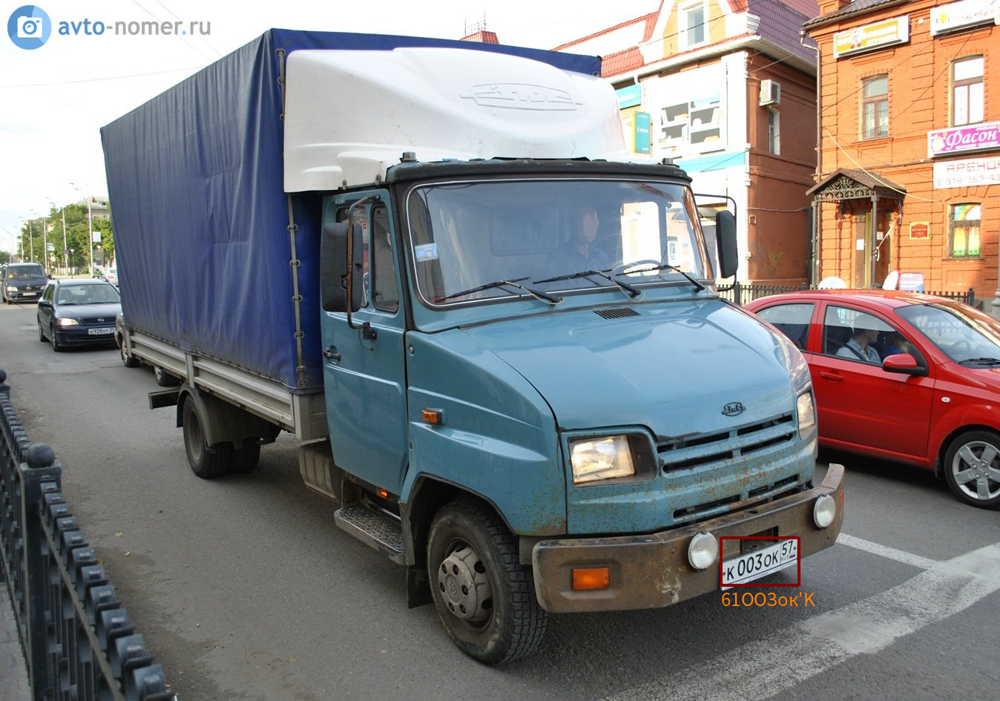

Выбранный метод: yolo+easyocr_custom
Найденные номера: K003OK57


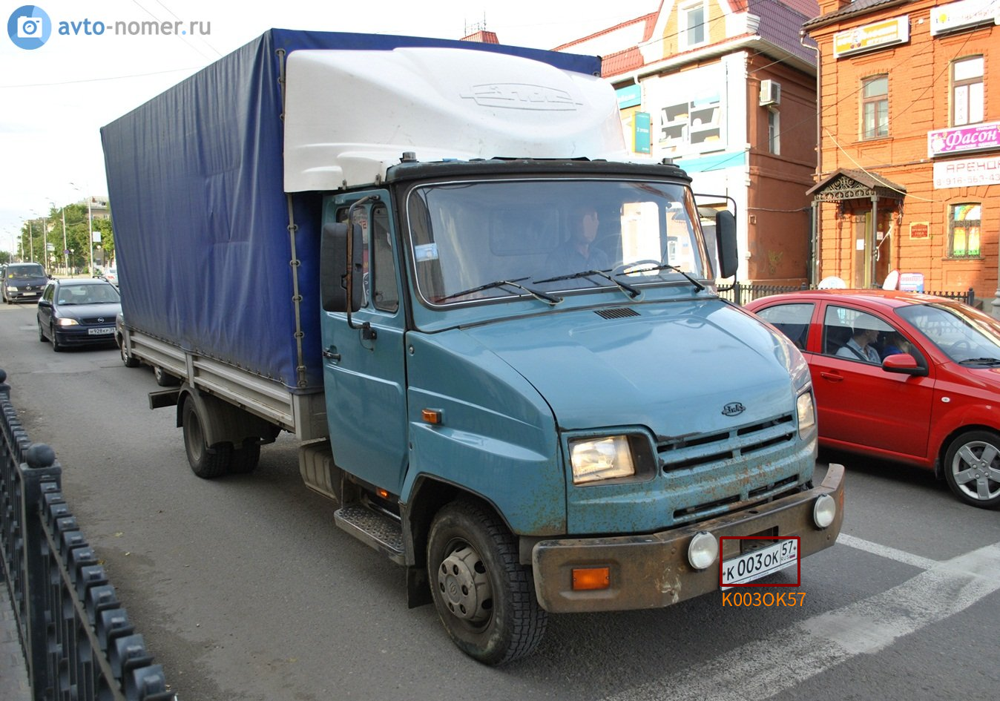

Выбранный метод: mtcnn+lprnet
Найденные номера: K003OK36


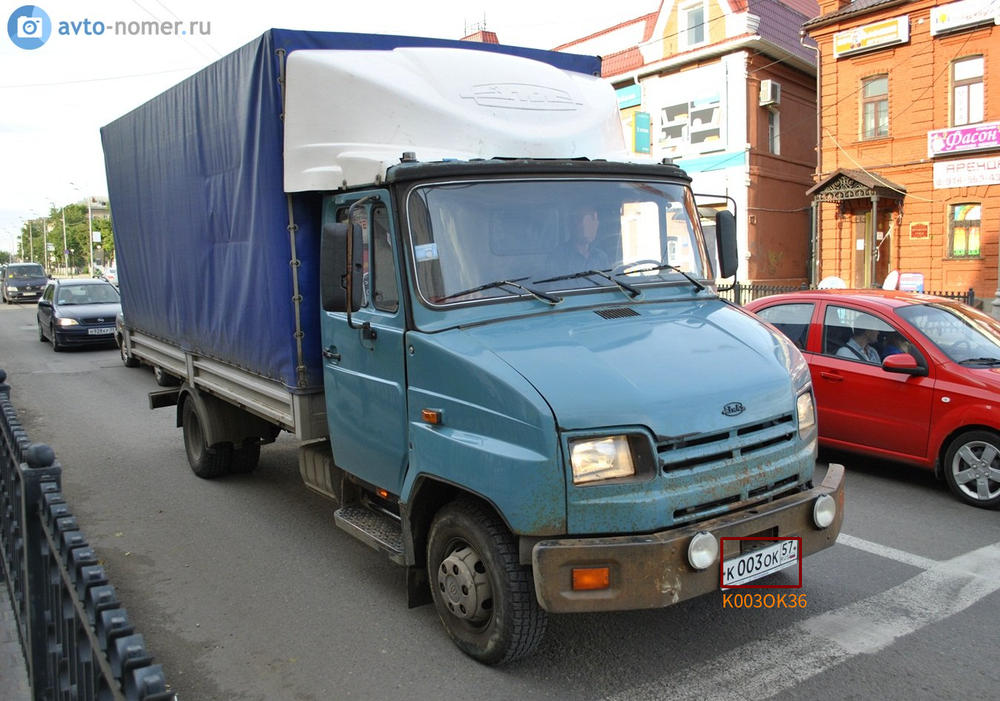

Выбранный метод: mtcnn+stnet+lprnet
Найденные номера: K003OK57


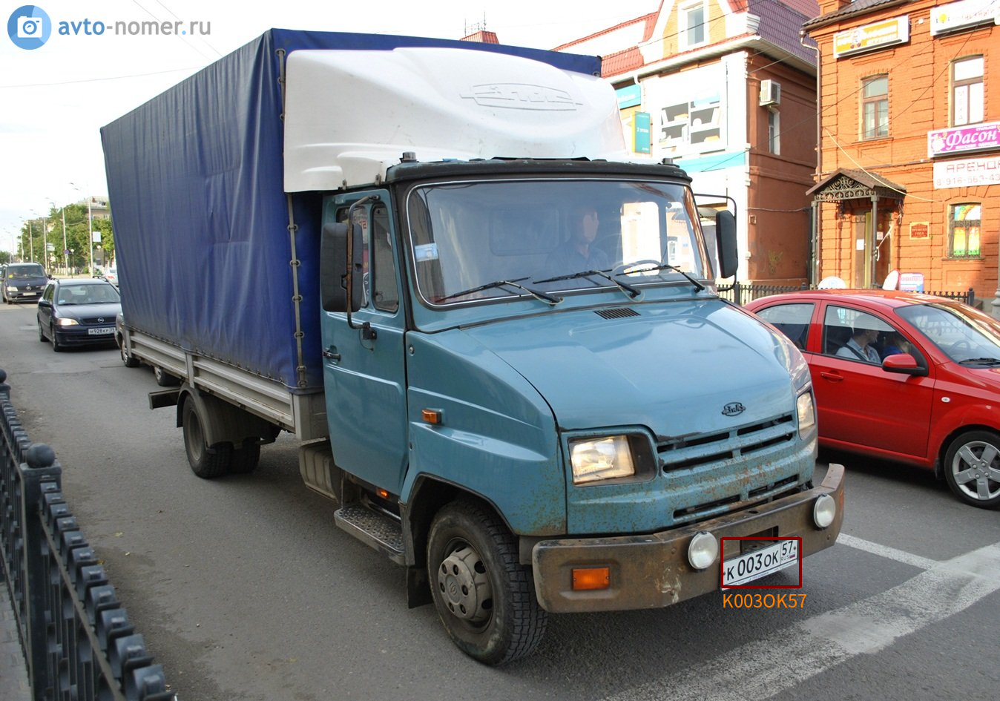

Выбранный метод: yolo+stnet+easyocr_custom
Найденные номера: K003OK57


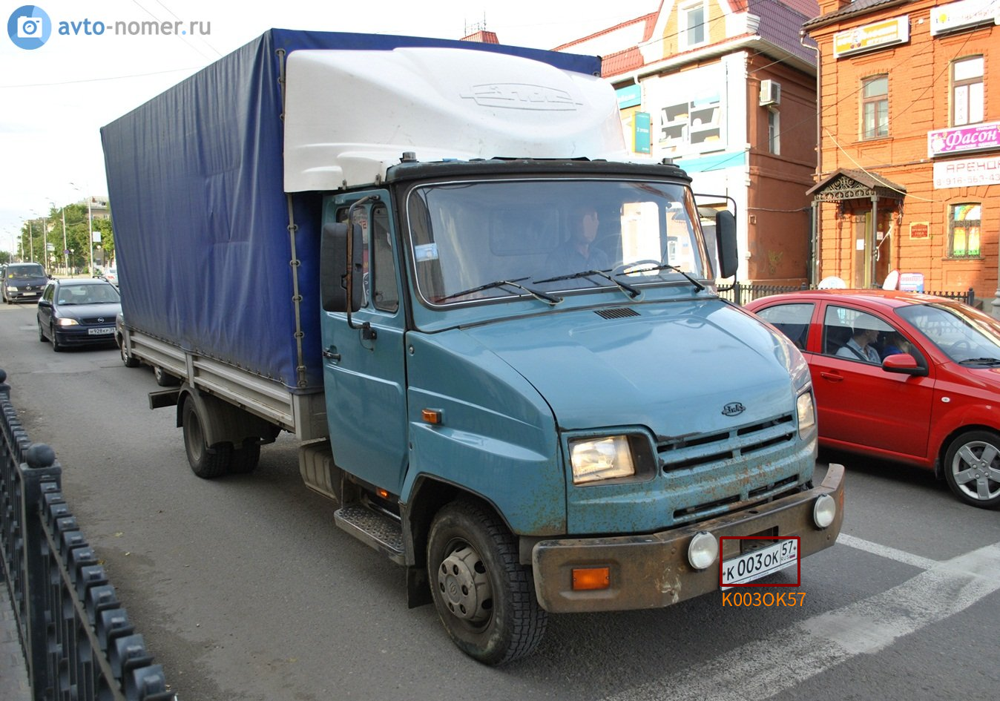

In [4]:
for exp in experiments:
    result_number, vis_image = exp.detect_by_image_path(IMAGE_PATH)
    print(f"Выбранный метод: {exp.name_model}")
    print(f"Найденные номера: {', '.join(result_number)}")
    display(vis_image)

### Тестирование модели на данном видео

In [2]:
model = Inference(detect_model="mtcnn",
                  ocr_model="lprnet",
                  transform_model = "stnet")

In [3]:
model.detect_by_video_path(
    path_to_video="./data/test_video.mp4",
    save_result_path="./result/demo_video.mp4"
)

OpenCV: FFMPEG: tag 0x47504a4d/'MJPG' is not supported with codec id 7 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'
